Q.1 Regression and out-of-distribution prediction:

a. Download the wine quality datasets from https://archive.ics.uci.edu/ml/datasets/Wine+Quality

b. Explore, visualize, and pre-process the data as appropriate. [1]

c. Train, validate varying at least one hyperparameter, and test at least two types of models: [2]

i. Random forest
ii. Support vector regression with RBF kernel
iii. Neural network with single hidden layer (output layer should have linear activation)

d. Search the net about how to determine the importance of each variable, and find the importance in
the final models tried. Comment on whether the same variables are important for different models.
[1]

e. Test the model for red with data from white and vice versa, and comment on whether the model for
red wines is applicable to white wines and versa or not. [1]

In [3]:
#Importing all necessary libraries
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.svm import SVR
from sklearn.metrics import r2_score
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import log_loss
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import precision_score, recall_score, f1_score,accuracy_score,confusion_matrix
from sklearn.inspection import permutation_importance
from sklearn.feature_selection import RFECV

In [4]:
#Reading data
from google.colab import drive
drive.mount('/content/drive')
white_fp="/content/drive/MyDrive/wine+quality/winequality-white.csv"
red_fp="/content/drive/MyDrive/wine+quality/winequality-red.csv"
white = pd.read_csv(white_fp, sep = ';')
red= pd.read_csv(red_fp,sep = ';')
print(white.shape)
white.head(4898)


Mounted at /content/drive
(4898, 12)


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7


In [5]:
#show red wine data
print(red.shape)
red.head(1599)

(1599, 12)


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


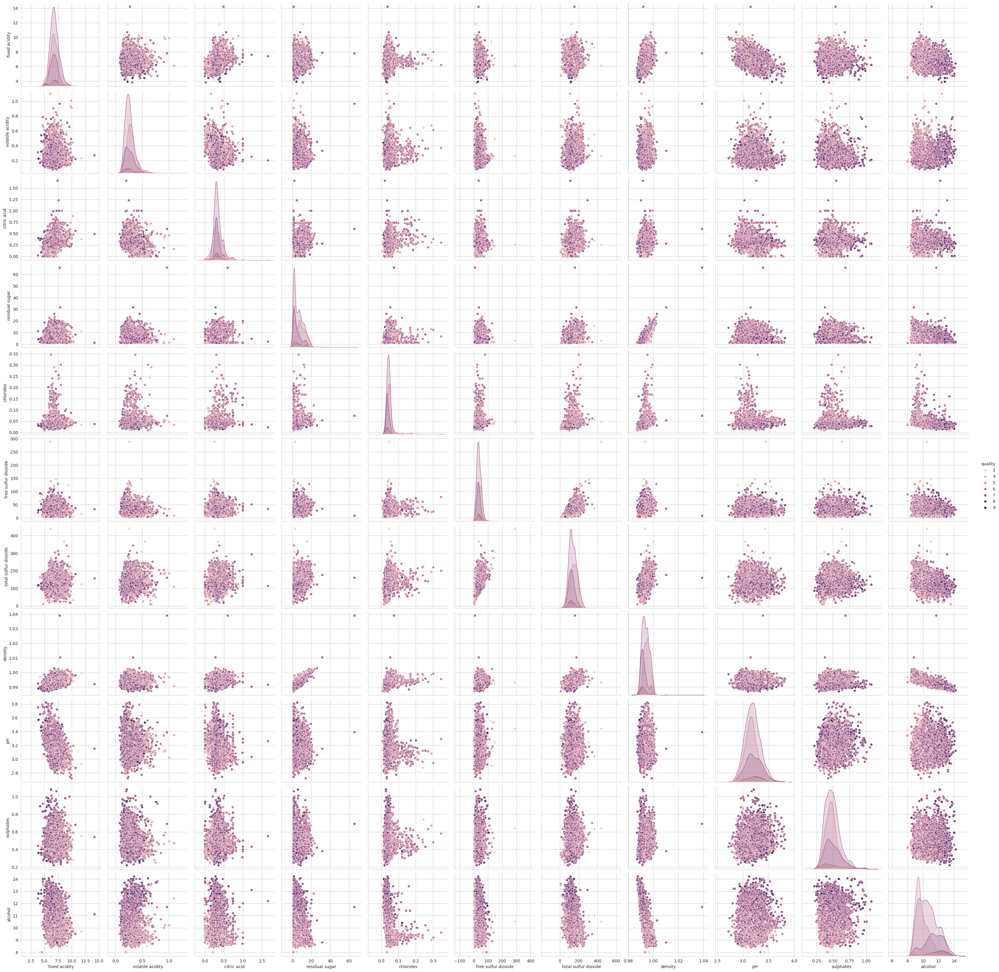

In [15]:
#to show pairwise distribution of features

plt.close();
sns.set_style("whitegrid");
sns.pairplot(white, hue="quality" ,height=3);
plt.show()

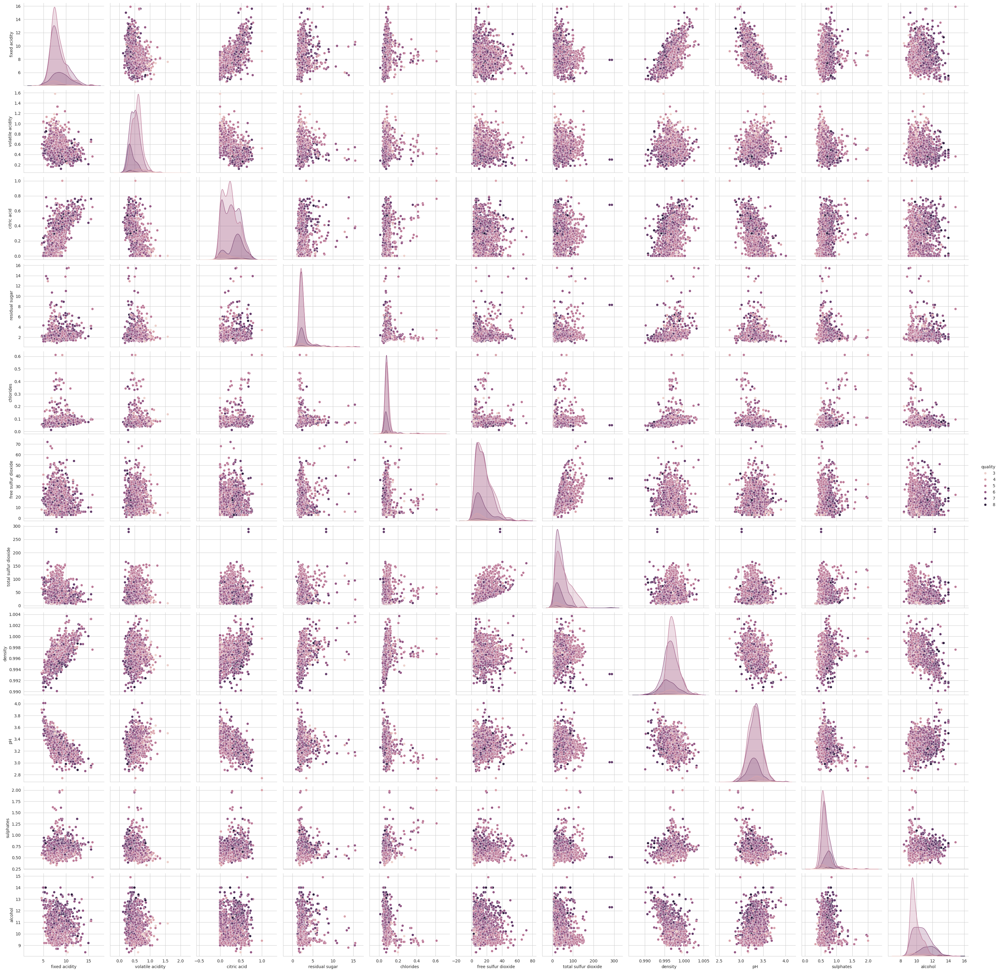

In [16]:
#to show pairwise distribution of features

plt.close();
sns.set_style("whitegrid");
sns.pairplot(red, hue="quality" ,height=3);
plt.show()

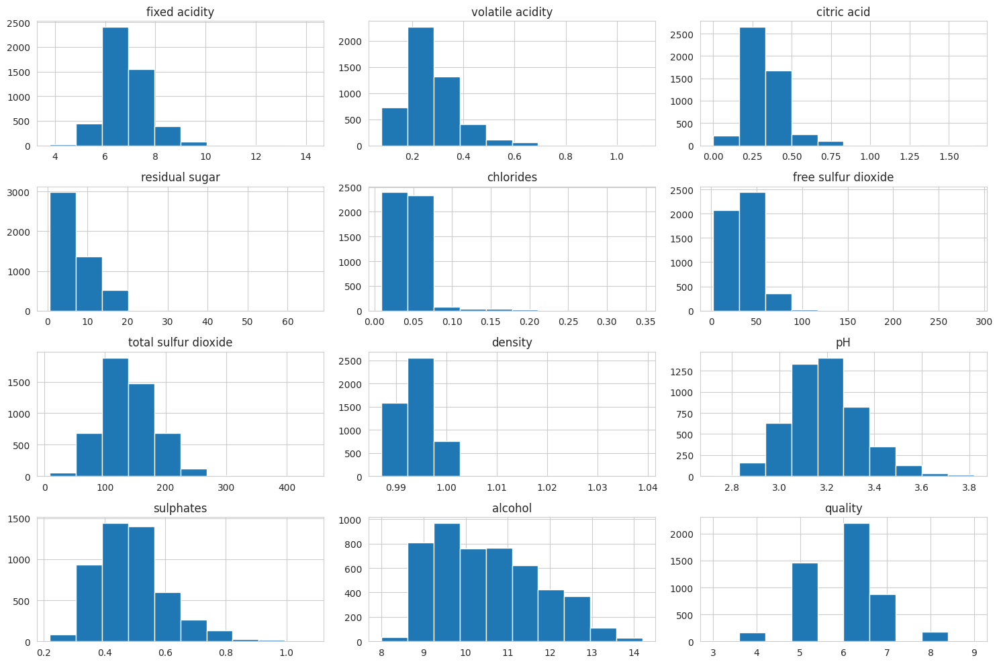

In [17]:
#Visualising White wine data each coloumn wise
white.hist(figsize=(15, 10))
plt.tight_layout()
plt.show()

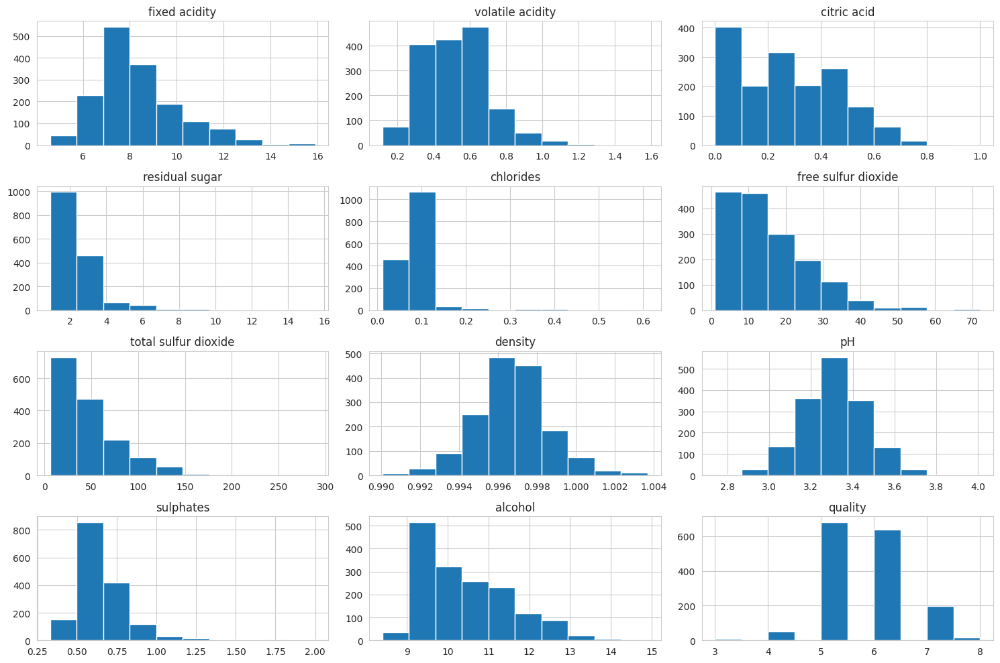

In [18]:
#Visualising Red wine data each coloumn wise
red.hist(figsize=(15, 10))
plt.tight_layout()
plt.show()

In [6]:
#Normalise data
#for red wine data
mean = red.mean()
std = red.std()
# Normalize the columns using column-wise mean and standard deviation
Redn = (red - mean) / std
print(Redn)

#for white wine data
mean = white.mean()
std = white.std()
# Normalize the columns using column-wise mean and standard deviation
whiten = (white - mean) / std
print(whiten)



      fixed acidity  volatile acidity  citric acid  residual sugar  chlorides  \
0         -0.528194          0.961576    -1.391037       -0.453077  -0.243630   
1         -0.298454          1.966827    -1.391037        0.043403   0.223805   
2         -0.298454          1.296660    -1.185699       -0.169374   0.096323   
3          1.654339         -1.384011     1.483689       -0.453077  -0.264878   
4         -0.528194          0.961576    -1.391037       -0.453077  -0.243630   
...             ...               ...          ...             ...        ...   
1594      -1.217415          0.403103    -0.980362       -0.382151   0.053829   
1595      -1.389721          0.123866    -0.877693       -0.240300  -0.541090   
1596      -1.159980         -0.099523    -0.723690       -0.169374  -0.243630   
1597      -1.389721          0.654416    -0.775024       -0.382151  -0.264878   
1598      -1.332285         -1.216469     1.021680        0.752659  -0.434854   

      free sulfur dioxide  

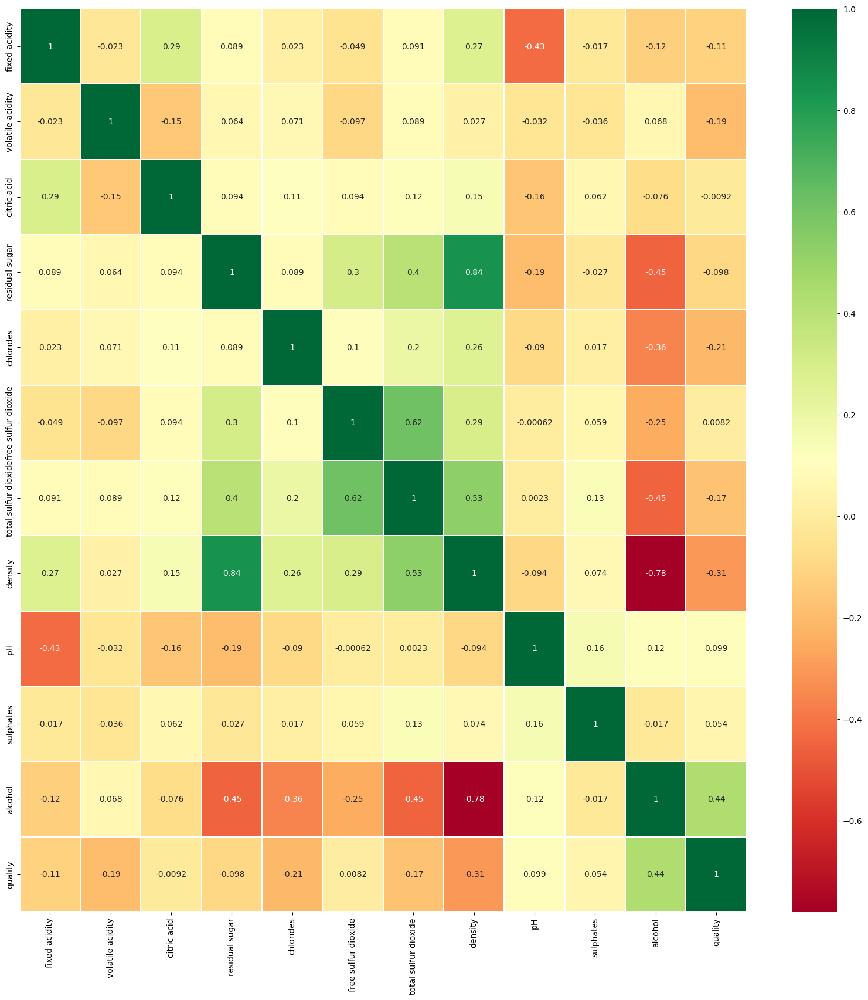

In [7]:
#Plot for correletion between features for white wine
correlation_white = white.corr(method='pearson')
plt.figure(figsize=(20,20))
sns.heatmap(correlation_white, cmap ='RdYlGn', linewidths = 0.30, annot = True)
plt.show()

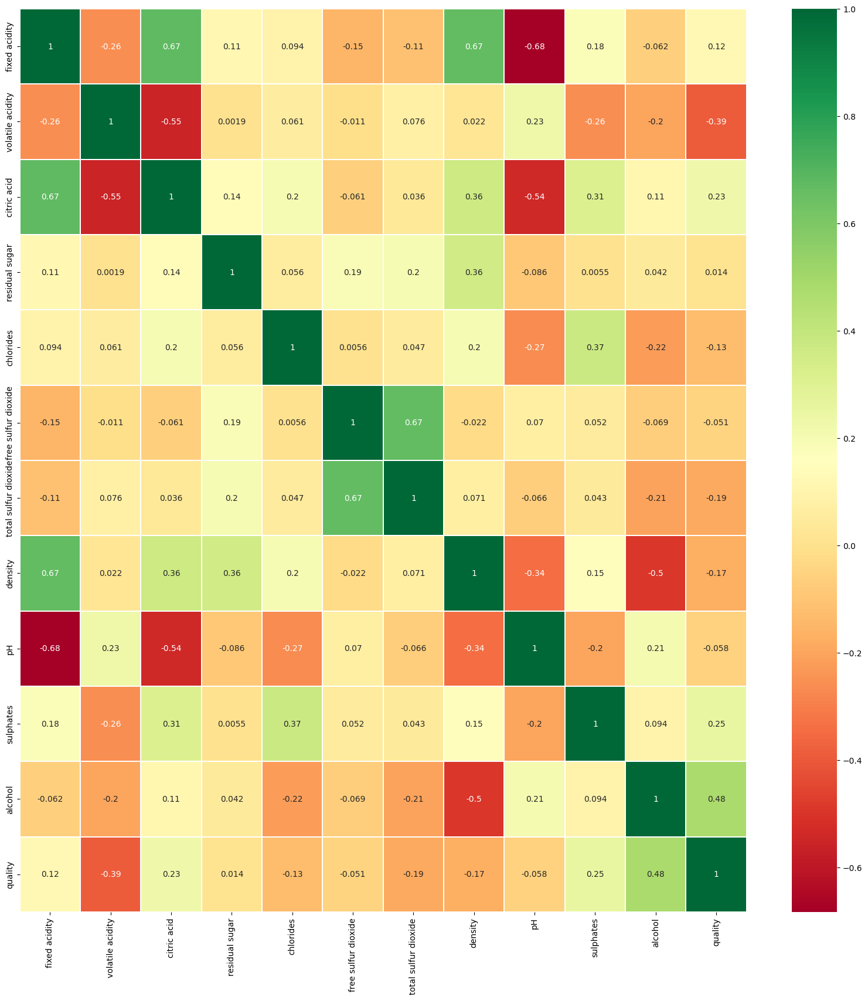

In [8]:
#Plot for correletion between features.
correlation_red = red.corr(method='pearson')
plt.figure(figsize=(20,20))
sns.heatmap(correlation_red, cmap ='RdYlGn', linewidths = 0.30, annot = True)
plt.show()

No 2 features have correlation more than 0.9. So I have not removed any correleted coloumns.

In [9]:
yw= whiten['quality']                                 #last column is quality=y
Xw= whiten.drop("quality",axis=1)

yr= Redn['quality']                                   #last column is quality=y
Xr= Redn.drop("quality",axis=1)

# Split the data into train  validation and test samples
#for white wine data
Xw_train, Xw_test, yw_train, yw_test = train_test_split(Xw, yw, test_size=0.15, random_state=42)
Xw_train, Xw_val, yw_train, yw_val = train_test_split(Xw_train, yw_train, test_size=0.20, random_state=42)

#for red wine data
Xr_train, Xr_test, yr_train, yr_test = train_test_split(Xr, yr, test_size=0.2, random_state=42)
Xr_train, Xr_val, yr_train, yr_val = train_test_split(Xr_train, yr_train, test_size=0.25, random_state=42)

MSE for no. of tree =  50 is 0.5296032994190734
MSE for no. of tree =  100 is 0.5316505368327445
MSE for no. of tree =  250 is 0.5294254885236109
MSE for no. of tree =  500 is 0.5295524245898042
MSE for no. of tree =  1000 is 0.525348799989618
MSE for no. of tree =  2000 is 0.5267630349162324


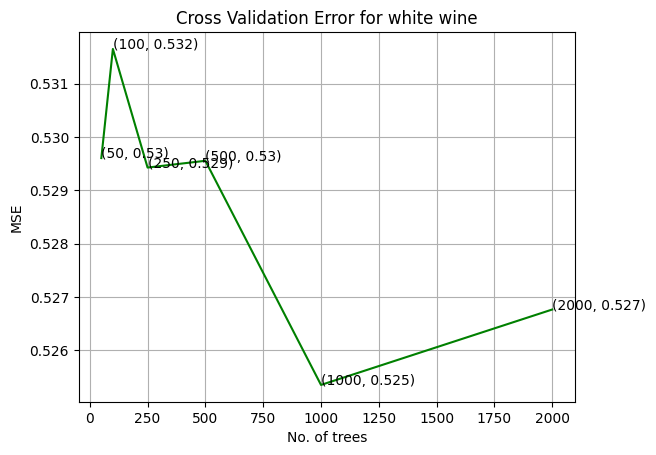

For No. of trees =  1000 The train MSE is: 0.06591901596774093
For No. of trees =  1000 The cross validation MSE is: 0.525348799989618
For No. of trees =  1000 The test MSE is: 0.48203555638745355
R^2 score on test data is: 0.5378804329396596


In [10]:
#for white wine data
# For cross validating, let alpha are number of trees in set
alpha = [50,100,250,500,1000,2000]
cv_MSE=[]
                                                                                      # creating empty list for MSE
#loop for cross validation for different values of number of trees
for i in alpha:
    rfw=RandomForestRegressor(n_estimators=i,random_state=42,n_jobs=-1)               #Fitting moadel on training data
    rfw.fit(Xw_train,yw_train)
    predict_y = rfw.predict(Xw_val)
    cv_MSE.append(mean_squared_error(yw_val, predict_y))                              #prediction on validaton data


#print all values of MSE for different values of number of trees
for i in range(len(cv_MSE)):
    print ('MSE for no. of tree = ',alpha[i],'is',cv_MSE[i])

#optimal no. trees with minimum CV error
best_alpha = np.argmin(cv_MSE)

#plot CV error vs no. of trees
fig, ax = plt.subplots()
ax.plot(alpha, cv_MSE,c='g')
for i, txt in enumerate(np.round(cv_MSE,3)):
    ax.annotate((alpha[i],np.round(txt,3)), (alpha[i],cv_MSE[i]))
plt.grid()
plt.title("Cross Validation Error for white wine")
plt.xlabel("No. of trees")
plt.ylabel("MSE")
plt.show()

#fit final model on traing data with optimal hyperparameter
rfw=RandomForestRegressor(n_estimators=alpha[best_alpha],random_state=42,n_jobs=-1)
rfw.fit(Xw_train,yw_train)

#print final MSE for train, validate and train
predict_y = rfw.predict(Xw_train)
print('For No. of trees = ', alpha[best_alpha], "The train MSE is:",mean_squared_error(yw_train, predict_y))
predict_y = rfw.predict(Xw_val)
print('For No. of trees = ', alpha[best_alpha], "The cross validation MSE is:",mean_squared_error(yw_val, predict_y))
predict_y = rfw.predict(Xw_test)
print('For No. of trees = ', alpha[best_alpha], "The test MSE is:",mean_squared_error(yw_test, predict_y))
r2_test = r2_score(yw_test, predict_y)
print('R^2 score on test data is:', r2_test)

MSE for no. of tree =  10 is 0.6490367365304225
MSE for no. of tree =  50 is 0.5812877471582828
MSE for no. of tree =  100 is 0.5721585866530206
MSE for no. of tree =  300 is 0.5677772625791467
MSE for no. of tree =  400 is 0.5700465818203522
MSE for no. of tree =  600 is 0.5681121230487258
MSE for no. of tree =  800 is 0.5685606734261238
MSE for no. of tree =  1000 is 0.5693523568893295


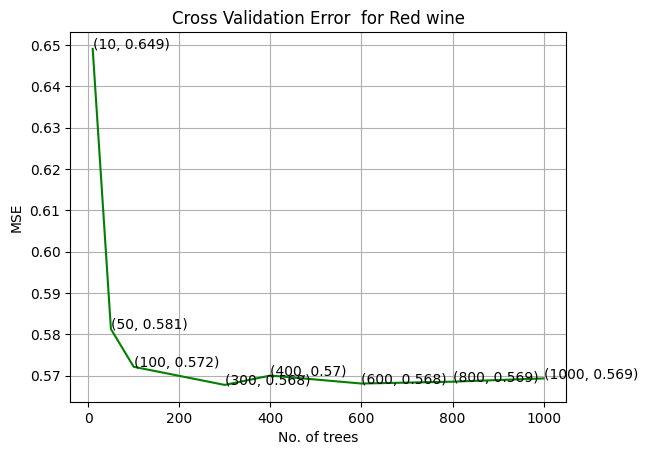

For No. of trees =  300 The train MSE is: 0.0802216544668428
For No. of trees =  300 The cross validation MSE is: 0.5677772625791467
For No. of trees =  300 The test MSE is: 0.505957744627161
R^2 score on test data is: 0.4950777440720209


In [11]:
#for red wine data
# For cross validating, let alpha are number of trees in set
alpha=[10,50,100,300,400,600,800,1000]
cvr_MSE=[]                             # creating empty list for MSE
#loop for cross validation for different values of number of trees
for i in alpha:
    rfr=RandomForestRegressor(n_estimators=i,random_state=42,n_jobs=-1)               #Fitting moadel on training data
    rfr.fit(Xr_train,yr_train)
    predict_y = rfr.predict(Xr_val)
    cvr_MSE.append(mean_squared_error(yr_val, predict_y))                              #prediction on validaton data


#print all values of MSE for different values of number of trees
for i in range(len(cvr_MSE)):
    print ('MSE for no. of tree = ',alpha[i],'is',cvr_MSE[i])

#optimal no. trees with minimum CV error
best_alpha = np.argmin(cvr_MSE)

#plot CV error vs no. of trees
fig, ax = plt.subplots()
ax.plot(alpha, cvr_MSE,c='g')
for i, txt in enumerate(np.round(cvr_MSE,3)):
    ax.annotate((alpha[i],np.round(txt,3)), (alpha[i],cvr_MSE[i]))
plt.grid()
plt.title("Cross Validation Error  for Red wine")
plt.xlabel("No. of trees")
plt.ylabel("MSE")
plt.show()

#fit final model on traing data with optimal hyperparameter
rfr=RandomForestRegressor(n_estimators=alpha[best_alpha],random_state=42,n_jobs=-1)
rfr.fit(Xr_train,yr_train)

#print final MSE for train, validate and train data
predict_y = rfr.predict(Xr_train)
print('For No. of trees = ', alpha[best_alpha], "The train MSE is:",mean_squared_error(yr_train, predict_y))
predict_y = rfr.predict(Xr_val)
print('For No. of trees = ', alpha[best_alpha], "The cross validation MSE is:",mean_squared_error(yr_val, predict_y))
predict_y = rfr.predict(Xr_test)
print('For No. of trees = ', alpha[best_alpha], "The test MSE is:",mean_squared_error(yr_test, predict_y))
r2_test = r2_score(yr_test, predict_y)
print('R^2 score on test data is:', r2_test)

Support vector regression

MSE for C =  0.05 is 0.6951600685332325
MSE for C =  0.1 is 0.6718196742159445
MSE for C =  0.5 is 0.6297131841953371
MSE for C =  1 is 0.6131878918007307
MSE for C =  3 is 0.6049428637988157
MSE for C =  5 is 0.6166423993971598


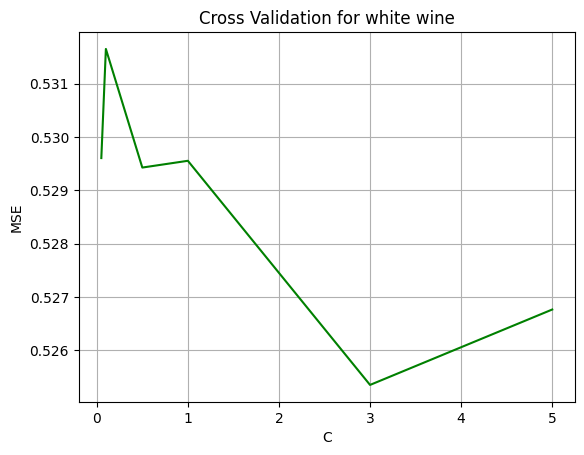

For C =  3 The train MSE is: 0.43826256416625786
For C =  3 The cross validation MSE is: 0.6049428637988157
For C =  3 The test MSE is: 0.6344423281639784
R^2 score on test data is: 0.3917705651982415


In [12]:
# For cross validating, let C in set
C= [0.05, 0.1, 0.5, 1,3,5]
cv_MSEs=[]                             # creating empty list for MSE
#loop for cross validation for different values of C
for i in C:
    svw=SVR(kernel='rbf',C=i)               #Fitting moadel on training data
    svw.fit(Xw_train,yw_train)
    predict_y = svw.predict(Xw_val)
    cv_MSEs.append(mean_squared_error(yw_val, predict_y))                              #prediction on validaton data


#print all values of MSE for different values of number of trees
for i in range(len(cv_MSEs)):
    print ('MSE for C = ',C[i],'is',cv_MSEs[i])

#optimal C with minimum CV error
best_C = np.argmin(cv_MSEs)

#plot CV error vs C
fig, ax = plt.subplots()
ax.plot(C, cv_MSE,c='g')
plt.grid()
plt.title("Cross Validation for white wine")
plt.xlabel("C")
plt.ylabel("MSE")
plt.show()

#fit final model on traing data with optimal hyperparameter
svw=SVR(kernel='rbf',C= C[best_C])
svw.fit(Xw_train,yw_train)

#print final MSE for train, validate and train
predict_y = svw.predict(Xw_train)
print('For C = ', C[best_C], "The train MSE is:",mean_squared_error(yw_train, predict_y))
predict_y = svw.predict(Xw_val)
print('For C = ', C[best_C], "The cross validation MSE is:",mean_squared_error(yw_val, predict_y))
predict_y = svw.predict(Xw_test)
print('For C = ', C[best_C], "The test MSE is:",mean_squared_error(yw_test, predict_y))
r2_test = r2_score(yw_test, predict_y)
print('R^2 score on test data is:', r2_test)

MSE for C =  0.01 is 0.8132403562364618
MSE for C =  0.05 is 0.6955534707827422
MSE for C =  0.1 is 0.6705021552766971
MSE for C =  0.3 is 0.6526824484444991
MSE for C =  0.5 is 0.6477259428945027
MSE for C =  1 is 0.644158739779956
MSE for C =  2 is 0.6418654333068543
MSE for C =  3 is 0.6427904488066847


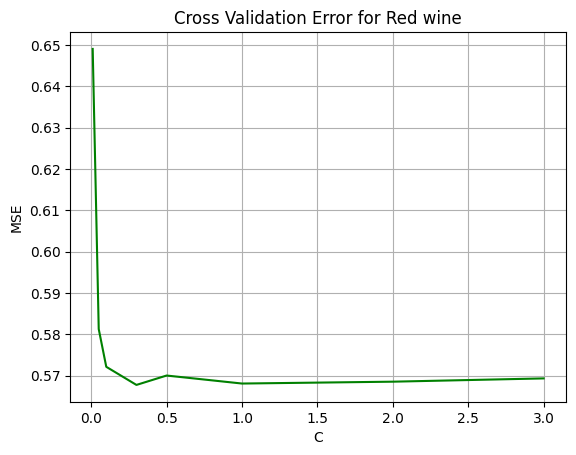

For C =  2 The train MSE is: 0.4297949060983997
For C =  2 The cross validation MSE is: 0.6418654333068543
For C =  2 The test MSE is: 0.5468081853638159
R^2 score on test data is: 0.45431090749043357


In [13]:
# For cross validating, let C in set
C= [0.01, 0.05, 0.1, 0.3, 0.5, 1, 2,3]
cvr_MSEs=[]                             # creating empty list for MSE of svr for red wine
#loop for cross validation for different values of C
for i in C:
    svr=SVR(kernel='rbf',C=i)               #Fitting moadel on training data
    svr.fit(Xr_train,yr_train)
    predict_y = svr.predict(Xr_val)
    cvr_MSEs.append(mean_squared_error(yr_val, predict_y))                              #prediction on validaton data


#print all values of MSE for different values of number of trees
for i in range(len(cvr_MSEs)):
    print ('MSE for C = ',C[i],'is',cvr_MSEs[i])

#optimal C with minimum CV error
best_C = np.argmin(cvr_MSEs)

#plot CV error vs C
fig, ax = plt.subplots()
ax.plot(C, cvr_MSE,c='g')
plt.grid()
plt.title("Cross Validation Error for Red wine")
plt.xlabel("C")
plt.ylabel("MSE")
plt.show()

#fit final model on traing data with optimal hyperparameter
svr=SVR(kernel='rbf',C= C[best_C])
svr.fit(Xr_train,yr_train)

#print final MSE for train, validate and train
predict_y = svr.predict(Xr_train)
print('For C = ', C[best_C], "The train MSE is:",mean_squared_error(yr_train, predict_y))
predict_y = svr.predict(Xr_val)
print('For C = ', C[best_C], "The cross validation MSE is:",mean_squared_error(yr_val, predict_y))
predict_y = svr.predict(Xr_test)
print('For C = ', C[best_C], "The test MSE is:",mean_squared_error(yr_test, predict_y))
r2_test = r2_score(yr_test, predict_y)
print('R^2 score on test data is:', r2_test)

Feature: 0, Score: 0.06140
Feature: 1, Score: 0.12747
Feature: 2, Score: 0.06008
Feature: 3, Score: 0.06491
Feature: 4, Score: 0.06559
Feature: 5, Score: 0.11224
Feature: 6, Score: 0.06813
Feature: 7, Score: 0.05993
Feature: 8, Score: 0.07170
Feature: 9, Score: 0.06226
Feature: 10, Score: 0.24628


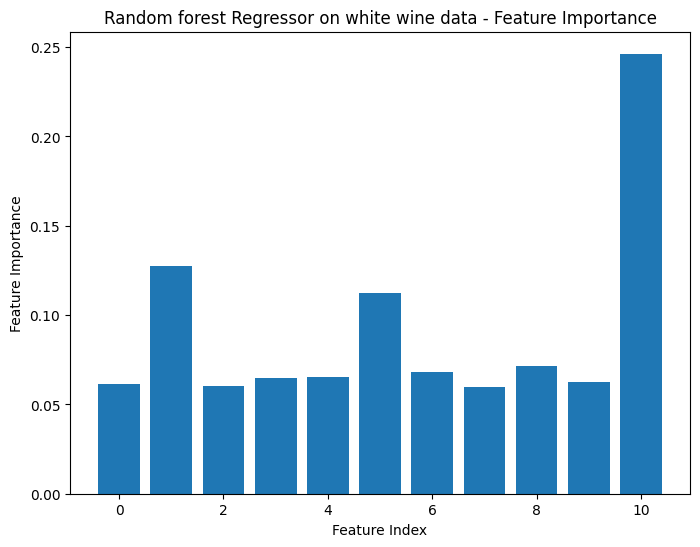

Feature: 0, Score: 0.04674
Feature: 1, Score: 0.12554
Feature: 2, Score: 0.04432
Feature: 3, Score: 0.06071
Feature: 4, Score: 0.05740
Feature: 5, Score: 0.04735
Feature: 6, Score: 0.08073
Feature: 7, Score: 0.05241
Feature: 8, Score: 0.05740
Feature: 9, Score: 0.15140
Feature: 10, Score: 0.27600


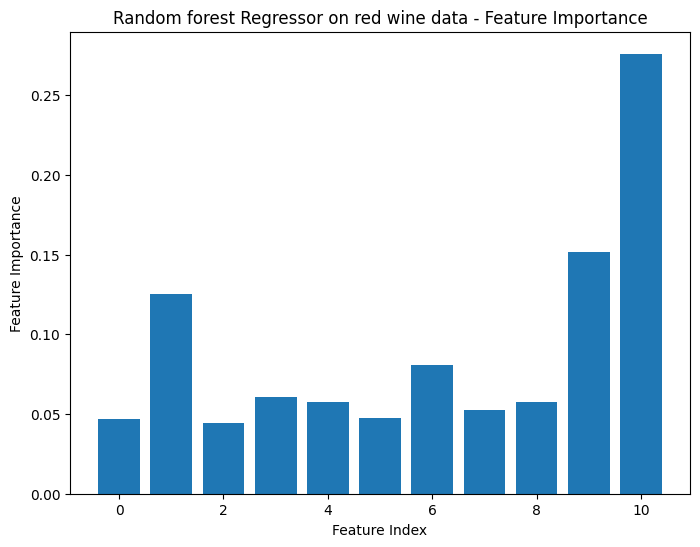

Feature: 0, Score: 0.09802
Feature: 1, Score: 0.17587
Feature: 2, Score: 0.10794
Feature: 3, Score: 0.17085
Feature: 4, Score: 0.08083
Feature: 5, Score: 0.12365
Feature: 6, Score: 0.12392
Feature: 7, Score: 0.38994
Feature: 8, Score: 0.13048
Feature: 9, Score: 0.10171
Feature: 10, Score: 0.18741


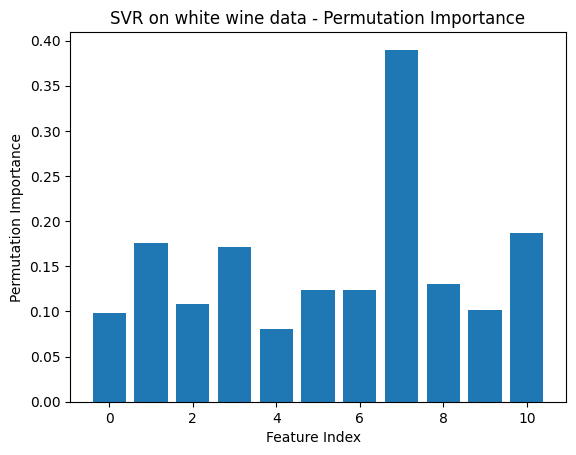

Feature: 0, Score: -0.00320
Feature: 1, Score: 0.07380
Feature: 2, Score: 0.00375
Feature: 3, Score: -0.01135
Feature: 4, Score: -0.02562
Feature: 5, Score: 0.00105
Feature: 6, Score: 0.02968
Feature: 7, Score: 0.01861
Feature: 8, Score: -0.01709
Feature: 9, Score: 0.03462
Feature: 10, Score: 0.24016


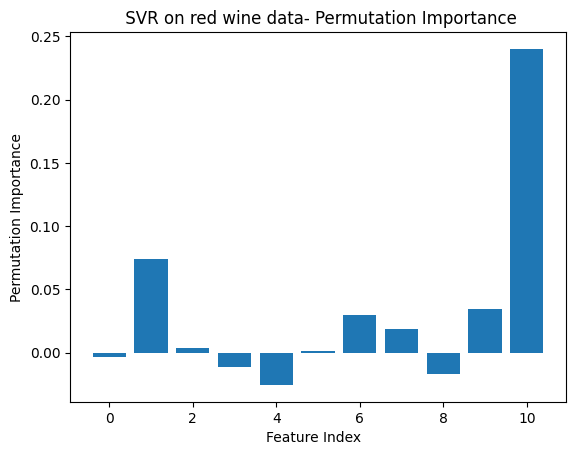

In [14]:
#C
#Feature importance of Random forest Regressor on white wine data
importance = rfw.feature_importances_

for i, v in enumerate(importance):
 print('Feature: %0d, Score: %.5f' % (i, v))

plt.figure(figsize=(8, 6))
plt.bar([x for x in range(len(importance))], importance)
plt.xlabel('Feature Index')
plt.ylabel('Feature Importance')
plt.title(f'Random forest Regressor on white wine data - Feature Importance')
plt.show()

#Feature importance of Random forest Regressor on red wine data
importance = rfr.feature_importances_
for i, v in enumerate(importance):
 print('Feature: %0d, Score: %.5f' % (i, v))

plt.figure(figsize=(8, 6))
plt.bar([x for x in range(len(importance))], importance)
plt.xlabel('Feature Index')
plt.ylabel('Feature Importance')
plt.title(f'Random forest Regressor on red wine data - Feature Importance')
plt.show()

#Feature importance of SVR on white wine data
result = permutation_importance(svw,Xw_train, yw_train, n_repeats=10, random_state=1)
importance = result.importances_mean
for i, v in enumerate(importance):
            print('Feature: %0d, Score: %.5f' % (i, v))
plt.figure()
plt.bar([x for x in range(len(importance))], importance, align='center')
plt.xlabel('Feature Index  ')
plt.ylabel('Permutation Importance')
plt.title(f'SVR on white wine data - Permutation Importance')
plt.show()

#Feature importance of SVR on red wine data
result = permutation_importance(svr,Xw_train, yw_train, n_repeats=10, random_state=1)
importance = result.importances_mean
for i, v in enumerate(importance):
            print('Feature: %0d, Score: %.5f' % (i, v))
plt.figure()
plt.bar([x for x in range(len(importance))], importance, align='center')
plt.xlabel('Feature Index  ')
plt.ylabel('Permutation Importance')
plt.title(f' SVR on red wine data- Permutation Importance')
plt.show()

From aove Permutation imprtance graphs we can observe that for red wine feature 10 has high importance than other features in both random forest and SVM Regression. Also Feature 1  shows  high importance in both models in general. Rest of the features show slight variation with change in model and chane in data.

In [31]:
#D
#Random forest model trained on white wine data and testing on red wine data
predict_y = rfw.predict(Xr_test)
print( "The test MSE of model trained on white wine data and tested on red wine data is:",mean_squared_error(yr_test, predict_y))
r2_test = r2_score(yr_test, predict_y)
print('R^2 score of model trained on white wine data and tested on red wine data is:', r2_test)

#Random forest model trained on red wine data and testing on white wine data
predict_y = rfr.predict(Xw_test)
print( "The test MSE of model trained on red wine data and tested on white wine data is:",mean_squared_error(yw_test, predict_y))
r2_test = r2_score(yw_test, predict_y)
print('R^2 score f model trained on red wine data and tested on white wine data is:', r2_test)


The test MSE of model trained on white wine data and tested on red wine data is: 0.7416307440942373
R^2 score of model trained on white wine data and tested on red wine data is: 0.25988707090638374
The test MSE of model trained on red wine data and tested on white wine data is: 0.8662800811348895
R^2 score f model trained on red wine data and tested on white wine data is: 0.16951152100224742


Above results shows very low R^2 score and high mean square error if "we apply Random forest model trained on white wine data and test on red wine data" or "Random forest model trained on red wine data and testing on white wine data". These shows that model trained on these data is poorly generalised and ***cannot*** be used for regression if red and white wine data are exhanged while training.

2. Classification:

a. Download the data to predict Down syndrome in mice from
https://archive.ics.uci.edu/ml/datasets/Mice+Protein+Expression#.
The prediction problem is to
either predict the genotype (binary) using the gene expression variables from DYRK1A_N to CaNA_N.

b. Explore, visualize, and pre-process the data as appropriate, including developing a strategy to deal
with missing variables. You can choose to impute the variable. The recommended way is to use
multivariate feature imputation (https://scikit-learn.org/stable/modules/impute.html) [1]

c. Train, validate varying at least one hyperparameter, and test at least two types of models: [2]
i. Random forest
ii. Support vector classification using RBF kernel
iii. Neural network with single hidden layer (output layer should be have softmax activation)

d. See if removing some features systematically will improve your models using recursive feature
elimination https://scikitlearn.
org/stable/modules/generated/sklearn.feature_selection.RFECV.html). [1]

In [15]:
#initialising filepath and priting data
fp="/content/drive/MyDrive/Data_Cortex_Nuclear.xls"
data = pd.read_excel(fp)
print(data)
#Seperate input and output from                                     #ref: chatgpt
X= data.iloc[:,1:78]
y= data.iloc[:,[78]]
print(y)
print(X)

       MouseID  DYRK1A_N   ITSN1_N    BDNF_N     NR1_N    NR2A_N    pAKT_N  \
0        309_1  0.503644  0.747193  0.430175  2.816329  5.990152  0.218830   
1        309_2  0.514617  0.689064  0.411770  2.789514  5.685038  0.211636   
2        309_3  0.509183  0.730247  0.418309  2.687201  5.622059  0.209011   
3        309_4  0.442107  0.617076  0.358626  2.466947  4.979503  0.222886   
4        309_5  0.434940  0.617430  0.358802  2.365785  4.718679  0.213106   
...        ...       ...       ...       ...       ...       ...       ...   
1075  J3295_11  0.254860  0.463591  0.254860  2.092082  2.600035  0.211736   
1076  J3295_12  0.272198  0.474163  0.251638  2.161390  2.801492  0.251274   
1077  J3295_13  0.228700  0.395179  0.234118  1.733184  2.220852  0.220665   
1078  J3295_14  0.221242  0.412894  0.243974  1.876347  2.384088  0.208897   
1079  J3295_15  0.302626  0.461059  0.256564  2.092790  2.594348  0.251001   

       pBRAF_N  pCAMKII_N   pCREB_N  ...   pCFOS_N     SYP_N  H

In [16]:
#Impute Data to missing values in X
imputer = IterativeImputer(max_iter=3, random_state=0)
data_imputed = imputer.fit_transform(X)
# Convert the imputed data array back to a DataFrame
Xi = pd.DataFrame(data_imputed, columns=X.columns)
# Normalize the columns using column-wise mean and standard deviation
mean = Xi.mean()
std = Xi.std()
Xn = (Xi - mean) / std
Xn.head()

/usr/local/lib/python3.10/dist-packages/sklearn/impute/_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


,DYRK1A_N,ITSN1_N,BDNF_N,NR1_N,NR2A_N,pAKT_N,pBRAF_N,pCAMKII_N,pCREB_N,pELK_N,...,SHH_N,BAD_N,BCL2_N,pS6_N,pCFOS_N,SYP_N,H3AcK18_N,EGR1_N,H3MeK4_N,CaNA_N
0,0.312237,0.517125,2.252667,1.497147,2.303890,-0.345735,-0.158295,-0.899252,0.602737,0.691570,...,-1.304799,-1.218828,-0.975805,-1.065782,-0.904678,-0.285612,-0.807466,-1.288372,-1.456592,1.065407
1,0.356302,0.285813,1.879451,1.419834,1.976527,-0.518728,-0.334131,-0.962337,0.441385,0.360091,...,-0.906305,-1.407021,-0.919098,-1.045682,-1.069357,-0.067614,-0.844271,-1.215467,-1.404096,1.279698
2,0.334481,0.449691,2.012037,1.124840,1.908955,-0.581858,-0.226552,-0.969151,0.541997,0.284897,...,-1.138084,-1.349457,-0.929758,-0.925842,-0.991375,-0.154987,-0.845458,-1.253783,-1.470096,1.856178
3,0.065119,-0.000643,0.801796,0.489792,1.219542,-0.248204,-0.199135,-1.070462,-0.172110,0.357323,...,-1.192335,-0.899516,-0.651510,-1.284424,-0.784824,-0.818610,-0.602830,-0.943886,-1.121631,1.143960
4,0.036341,0.000764,0.805363,0.198116,0.939697,-0.483383,-0.304139,-1.084601,-0.628248,0.162466,...,-0.726905,-0.988638,-0.678900,-1.172352,-0.808092,-0.179419,-0.759022,-1.100787,-1.095163,1.582797


In [17]:
#Encoding Output labels to 0 and 1
label_encoder = LabelEncoder()
y['Genotype'] = label_encoder.fit_transform(y['Genotype'])
print(y)

      Genotype
0            0
1            0
2            0
3            0
4            0
...        ...
1075         1
1076         1
1077         1
1078         1
1079         1

[1080 rows x 1 columns]


<ipython-input-17-34477847afcd>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y['Genotype'] = label_encoder.fit_transform(y['Genotype'])


In [18]:
# Split the data into train ,validate and test sets
X_train, X_test, y_train, y_test = train_test_split(Xn, y, test_size=0.15, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.20, random_state=42)
y_train = np.ravel(y_train)
y_test = np.ravel(y_test)
y_val = np.ravel(y_val)

log_loss for No. of DT =  10 is 0.2202684255528608
log_loss for No. of DT =  50 is 0.21050512975459473
log_loss for No. of DT =  100 is 0.20581617307263292
log_loss for No. of DT =  500 is 0.20491661746362164
log_loss for No. of DT =  1000 is 0.20390399983087934
log_loss for No. of DT =  2000 is 0.2055194402162363
log_loss for No. of DT =  3000 is 0.20583349098480952


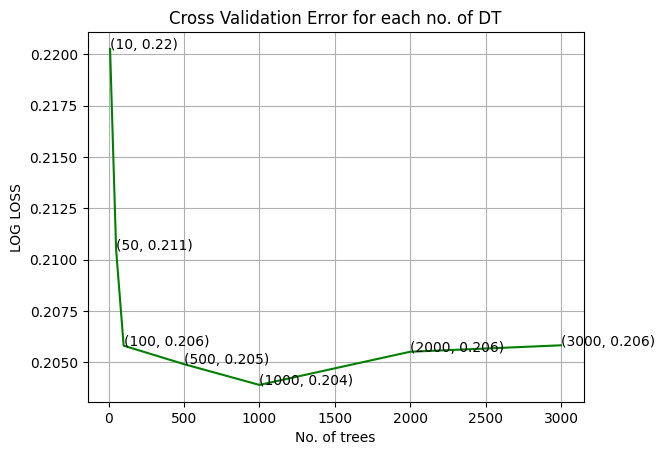

For No. of trees  =  1000 The train log loss is: 0.06662895429777464
For No. of trees  =  1000 The cross validation log loss is: 0.20390399983087934
For No. of trees  =  1000 The test log loss is: 0.18032398770489363
F1-score on test data is : 0.9873417721518987


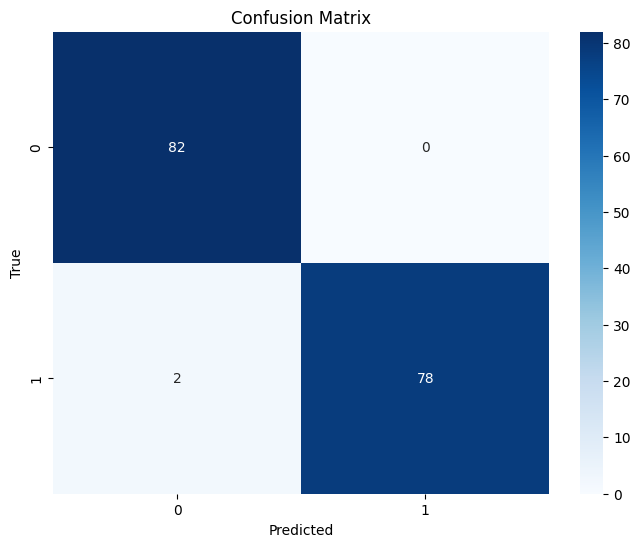

In [19]:

# For cross validating, let alpha are number of trees in set
alpha=[10,50,100,500,1000,2000,3000]
cv_log_error_array=[]

for i in alpha:
    rf=RandomForestClassifier(n_estimators=i,random_state=42,n_jobs=-1)          #Fitting moadel on training data
    rf.fit(X_train, y_train)
    predict_y = rf.predict_proba(X_val)
    cv_log_error_array.append(log_loss(y_val, predict_y, labels=rf.classes_, eps=1e-15))

#print  Error for different values of number of trees
for i in range(len(cv_log_error_array)):
    print ('log_loss for No. of DT = ',alpha[i],'is',cv_log_error_array[i])

#optimal no. trees with minimum CV error
best_alphat = np.argmin(cv_log_error_array)
#plot CV error vs no. of trees

fig, ax = plt.subplots()
ax.plot(alpha, cv_log_error_array,c='g')
for i, txt in enumerate(np.round(cv_log_error_array,3)):
    ax.annotate((alpha[i],np.round(txt,3)), (alpha[i],cv_log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each no. of DT")
plt.xlabel("No. of trees")
plt.ylabel("LOG LOSS")
plt.show()
#fit final model on traing data with optimal hyperparameter

rf=RandomForestClassifier(n_estimators=alpha[best_alphat],random_state=42,n_jobs=-1)
rf.fit(X_train,y_train)
#print final log loss for train, validate and train data

predict_y = rf.predict_proba(X_train)
print('For No. of trees  = ', alpha[best_alphat], "The train log loss is:",log_loss(y_train, predict_y))
predict_y = rf.predict_proba(X_val)
print('For No. of trees  = ', alpha[best_alphat], "The cross validation log loss is:",log_loss(y_val, predict_y))
predict_y = rf.predict_proba(X_test)
print('For No. of trees  = ', alpha[best_alphat], "The test log loss is:",log_loss(y_test, predict_y))
y= rf.predict(X_test)
f1 =f1_score(y_test, y)
print("F1-score on test data is :", f1)
confusion = confusion_matrix(y_test, y)
plt.figure(figsize=(8, 6))
sns.heatmap(confusion, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()


log_loss for c =  0.01 is 0.4260332219076915
log_loss for c =  0.05 is 0.426182431916602
log_loss for c =  0.1 is 0.2893999230011547
log_loss for c =  0.3 is 0.15946257146544981
log_loss for c =  0.5 is 0.1288718084727929
log_loss for c =  1 is 0.1129592624416208
log_loss for c =  2 is 0.08099111583984717
log_loss for c =  3 is 0.0747214616794748


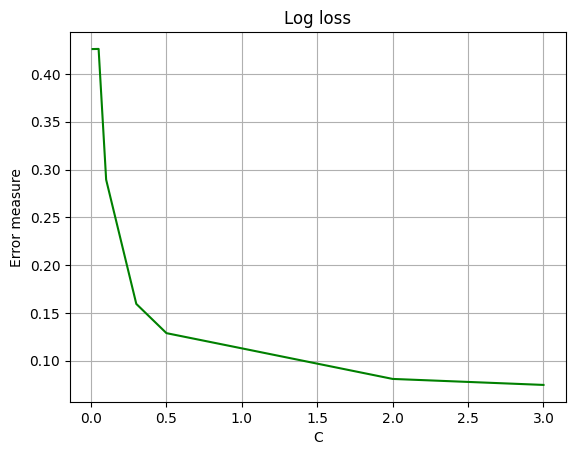

For values of C =  3 The train log loss is: 0.001305073753877902
For values of C =  3 The cross validation log loss is: 0.0747214616794748
For values of C =  3 The test log loss is: 0.007655073961749692
F1-score on test data is : 1.0


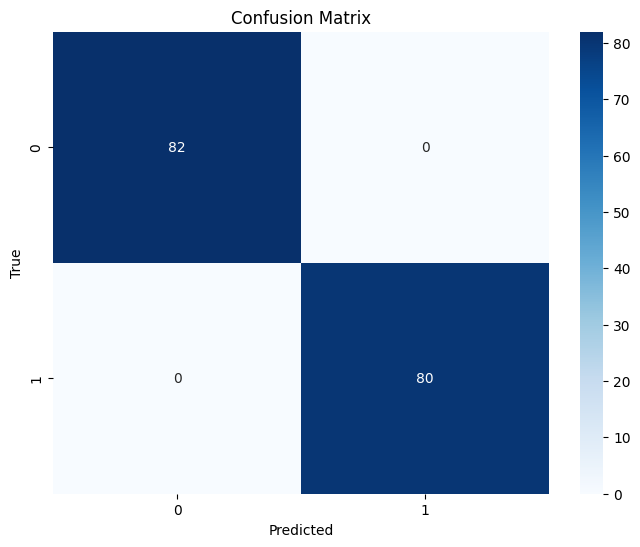

In [20]:
# For cross validating, let C in set
alpha=[0.01, 0.05, 0.1, 0.3, 0.5, 1, 2,3]
cv_log_error_array=[]
train_log_error_array=[]
from sklearn.svm import SVC
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import log_loss
from sklearn.metrics import confusion_matrix


for i in alpha:
    sv=SVC(C=i, kernel='rbf', probability=True, random_state=42)
    sv.fit(X_train,y_train)
    predict_y = sv.predict_proba(X_val)
    cv_log_error_array.append(log_loss(y_val, predict_y, labels=sv.classes_, eps=1e-15))

#print  Error for different values of C
for i in range(len(cv_log_error_array)):
    print ('log_loss for c = ',alpha[i],'is',cv_log_error_array[i])

#optimal C with minimum CV log loss
best_alpha = np.argmin(cv_log_error_array)

#plot CV error vs no. of trees
fig, ax = plt.subplots()
ax.plot(alpha, cv_log_error_array,c='g')
plt.grid()
plt.title("Log loss")
plt.xlabel("C")
plt.ylabel("Error measure")
plt.show()
#fit final model on traing data with optimal hyperparameter
sv=SVC(C=alpha[best_alpha], kernel='rbf', probability=True, random_state=42)
sv.fit(X_train,y_train)
#print final log loss for train, validate and train data
predict_y = sv.predict_proba(X_train)
print('For values of C = ', alpha[best_alpha], "The train log loss is:",log_loss(y_train, predict_y))
predict_y = sv.predict_proba(X_val)
print('For values of C = ', alpha[best_alpha], "The cross validation log loss is:",log_loss(y_val, predict_y))
predict_y = sv.predict_proba(X_test)
print('For values of C = ', alpha[best_alpha], "The test log loss is:",log_loss(y_test, predict_y))
y= sv.predict(X_test)
f1 =f1_score(y_test, y)
print("F1-score on test data is :", f1)
confusion = confusion_matrix(y_test, y)
plt.figure(figsize=(8, 6))
sns.heatmap(confusion, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()

In [21]:
from sklearn.feature_selection import RFECV

from sklearn.model_selection import StratifiedKFold

                                     #ref:chatgpt

rf= RandomForestClassifier(n_estimators=1000)     #no. of trees=1000 fom part b
rfecv = RFECV(estimator=rf, scoring="accuracy",
              min_features_to_select=1)

# Fit RFECV on train data
rfecv.fit(X_train, y_train)

# Print Optimal number of features
print(f"Optimal number of features: {rfecv.n_features_}")

# Print ranking of features
print(f"Ranking of features: {rfecv.ranking_}")


Optimal number of features: 62
Ranking of features: [ 1  1  1  1  1  1 10  1  1  1  1  3  1  1  1  1  1  1  2  6  1  1  1  1
  1  1  1  7  1  9  1 12  1  1  1  1  1  1  1  1  1  1  1 14 11  1  1  1
  1  1  1  1  1  1  1  8  1  1  1  1  1  1  1  1 13  1  1  1  4 15  1 16
  1  1  5  1  1]


The test log loss is: 0.1730573856245026
F1-score on test data is : 1.0


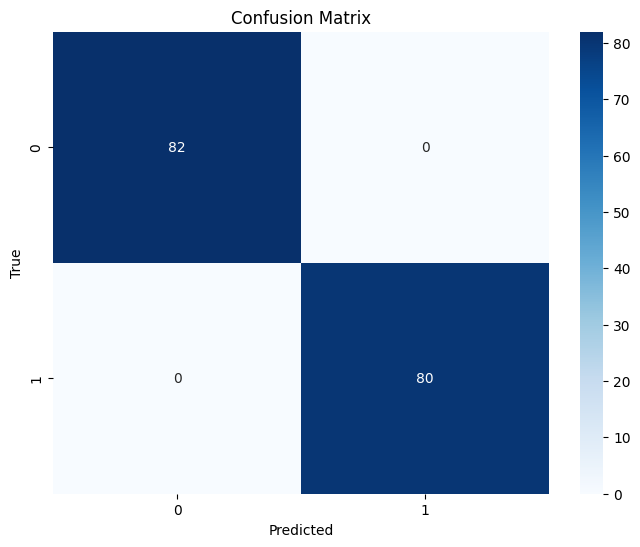

In [24]:
predict_y = rfecv.predict_proba(X_test)
print( "The test log loss is:",log_loss(y_test, predict_y))
predict_y = rfecv.predict_proba(X_test)
f1 =f1_score(y_test, y)
print("F1-score on test data is :", f1)
confusion = confusion_matrix(y_test, y)
plt.figure(figsize=(8, 6))
sns.heatmap(confusion, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()